<a name="introduction"></a>
# Exploring the Profiles of Tech Workers 

In the US we like to think that we are the melting pot of the world. However we know that sometimes that mixture does not happen evenly or smoothly. With this in mind, I choose to see if I could develop a model that accurately predicts whether or not someone works in the tech space based on physical features and other demographic info typically found on a dating profile but rarely included in job candidate profiles. My hope is that this can be the starting point for a larger project that seeks to understand the level of diversity or lack there of in the workplace. Below you will find a recap of the steps taken to reach that goal as well as my full process of impoving that model. 

## Table of Contents 

1. [Introduction/Project Focus](#introduction) 
2. [Data Collection, Preprocessing, and Feature Engineering](#section2)
3. [Exploratory Data Analysis Recap](#section3) 
4. [Model Fitting, Testing, and Optimizing](#section4) 
    1. [Data Setup](#section4a) 
    2. [Baseline Model](#section4b) 
    3. [Feature Selection](#section4c) 
    4. [Grid Search](#section4d)  
    5. [Final Model](#section4e) 
5. [Conclusion](#section5)  
    1. [Next Steps](#section5a) 

<a name="section2"></a>
## Data Collection, Preprocessing, and Feature Engineering

The data I decided to use was found on kaggle (link below) and was originally collected from the website/app OKCupid in the San Francisco, CA area in 2012. This data originally contained 60k observations and 31 columns. Of the 31 columns, 10 were essay columns which were dropped along with the income column, due to a high percentage of missing columns, and the "last online" column, due to its irrelevance to this project. Status was also dropped due to the fact that since the data came from a dating website, nearly all observations belong to the "single" class. The file containing the clean up process can be found in the folder: data_exploration, under the name: raw_preprocessing_do_not_run.ipynb. Please not that due to githubs size limitations, the original unprocessed file has not been included within this repo. 

Due to nature of the features included the data was heavily preproccessed with every feature being affected in some way. Of the 18 remaining 16 were categorical because of this each one was handeled individually and with doman taken into account. Examples of this include grouping similar group together and removing attitudes from responses, as well as creating a new 'unknown' class for observations with missing entries with the assumption that there might be a different between somone who chose to answer the given question and someone who did not. This is accounts for the majority of feature engineering in my project. In addition to this, a binary column was added relating to whether or not somone was above average height and job catagory was also changed into a binary to discuss the target in question for my purposes which was people who work in tech. Lastly, all categorical columns were dummied to streamline the modeling process.

[Go to Preprocessing File](https://github.com/DataOnATangent/representative_profiles/blob/main/data_exploration/raw_preprocessing_do_not_run.ipynb) 

[Go to Kaggle Data](https://www.kaggle.com/andrewmvd/okcupid-profiles)

<a name="section3"></a>
## Exploratory Data Analysis Recap

The exploratory pro

In [13]:
#Import necessary packages
import pandas as pd  
import numpy as np
import warnings
warnings.filterwarnings("ignore")   
from imblearn.over_sampling import SMOTE, ADASYN  
from sklearn.metrics import plot_confusion_matrix, confusion_matrix, classification_report, precision_score, recall_score, accuracy_score, f1_score, accuracy_score, roc_curve, auc
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
import matplotlib.pyplot as plt 
from sklearn.feature_selection import SelectFromModel, RFECV   
from sklearn.metrics import accuracy_score, roc_curve, auc 
from sklearn.linear_model import LogisticRegression, LassoCV
from sklearn.datasets import make_classification 
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
import seaborn as sns
%matplotlib inline
sns.set_context("notebook") 
from pandas_profiling import ProfileReport  
import plotly.express as px 
import plotly.graph_objects as go

In [2]:
#Load datasets 
data = pd.read_csv('data_nd.csv') #loads dataset that contains all processed features
del data['Unnamed: 0'] #deletes old index column

df = pd.read_csv('data_ad.csv') #loads dataset that contains only the features selected during model testing 
del df['Unnamed: 0'] #deletes old index column

df.head()

,age,height,works_in_tech,female,male,bisexual,gay,straight,body_average,body_curvy/full_figured,...,virgo,language_unknown,speaks_bengali,speaks_chinese,speaks_english,speaks_hindi,speaks_japanese,speaks_portuguese,speaks_russian,speaks_spanish
0,22,75.0,0,0,1,0,0,1,0,1,...,0,0,0,0,1,0,0,0,0,0
1,35,70.0,0,0,1,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,1
2,29,66.0,0,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
3,29,67.0,1,0,1,0,0,1,1,0,...,0,0,0,1,0,0,0,0,0,0
4,31,65.0,0,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,1


#### Data Profile 

I started my data exploration with a data profile which gave me a very good overview of my data and allowed me to have an idea about what I wanted to look at more closely.

In [27]:
#Here we use the profile report package to run an intial report of our data with visuals included
data_profile = ProfileReport(data, title = 'OKC Profile Data')
data_profile

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Individual Charts

Based off of what I saw in the data profile a number imbalances became apparent and so I chose to look at the variables against the target column. These were the ones where insights could be discerned pretty clearly. 

>Gender: Although there is a gender gap in both tech and non tach workers the relative difference is quite stark in the tach field. 

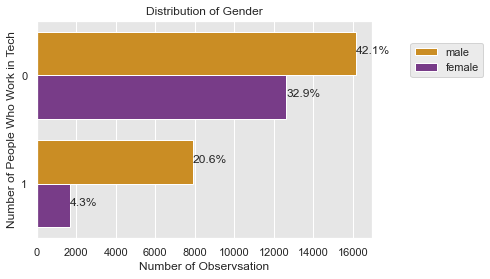

In [105]:
ax = sns.countplot(y="works_in_tech", data=data, hue='sex', palette="CMRmap_r")
plt.title('Distribution of Gender')
plt.xlabel('Number of Observsation') 
plt.ylabel('Number of People Who Work in Tech')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=2)

total = len(data['works_in_tech'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

>Body Type: Here we see that although fit/athletic is over represented in both, which notably is likely due to the source data coming from a dating website, we again see a difference in the relative differences between tech and non tech workers. 

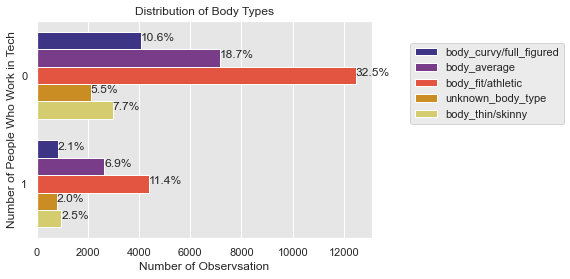

In [106]:
ax = sns.countplot(y="works_in_tech", data=data, hue='body_type', palette="CMRmap")
plt.title('Distribution of Body Types')
plt.xlabel('Number of Observsation') 
plt.ylabel('Number of People Who Work in Tech')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=2)

total = len(data['works_in_tech'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

> Ethnicity: Lastly, we see once again see a porportional difference in ethnicity. Although white is the most represented we can see that Asians are represented proportionally greater amoung tech workers. 

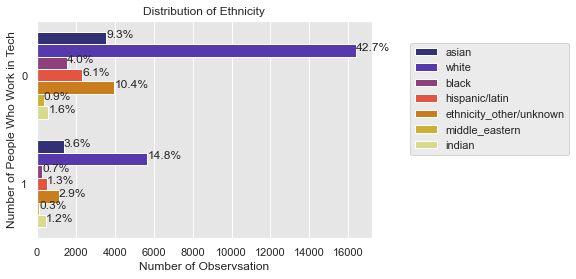

In [107]:
ax = sns.countplot(y="works_in_tech", data=data, hue='ethnicity', palette="CMRmap")
plt.title('Distribution of Ethnicity')
plt.xlabel('Number of Observsation') 
plt.ylabel('Number of People Who Work in Tech')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=2)

total = len(data['works_in_tech'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

> Age: When looking at age we can see that tech workers tend to be younger verssus the general population.

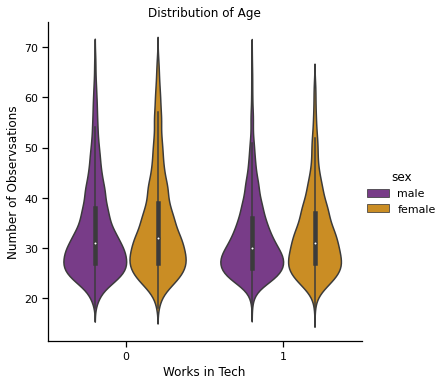

In [21]:
sns.catplot(x="works_in_tech", y="age", hue="sex", palette="CMRmap", kind="violin", data=data) 
plt.title('Distribution of Age')
plt.xlabel('Works in Tech') 
plt.ylabel('Number of Observsations')
plt.show()

> Height: Here although highly comparable, it seems that there is less variation in height, however this could be due to the overall class imbalance that exist between tech and non tech workers.

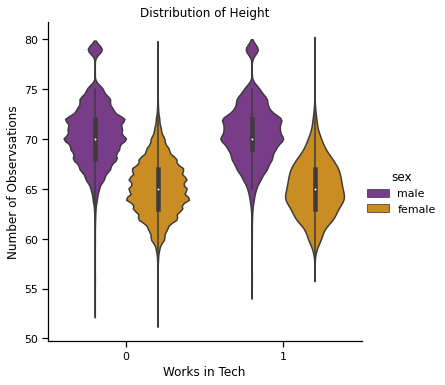

In [22]:
sns.catplot(x="works_in_tech", y="height", hue="sex", palette="CMRmap", kind="violin", data=data)  
plt.title('Distribution of Height')
plt.xlabel('Works in Tech') 
plt.ylabel('Number of Observsations')
plt.show()

#### Parallel Plots 

Because what I saw was proportional difference, I choose to look at a few more features in a different way. Parallel plots allow you to have a better visual sense of those differnces. 

In [11]:
profile_df = data.copy()
# Create dimensions

job_dim = go.parcats.Dimension(
    values=profile_df.works_in_tech, label="Works in Tech", categoryarray=[0, 1],
    ticktext=['No', 'Yes']
)

gender_dim = go.parcats.Dimension(values=profile_df.sex, label="Sex")

ethnicity_dim = go.parcats.Dimension(
    values=profile_df.ethnicity,
    categoryorder='category ascending', label="Ethnicity"
)



# Create parcats trace
color = profile_df.works_in_tech;
colorscale = [[0, 'lightsteelblue'], [1, 'coral']];

fig = go.Figure(data = [go.Parcats(dimensions=[job_dim, gender_dim, ethnicity_dim],
        line={'color': color, 'colorscale': colorscale},
        hoveron='color', hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='freeform' )])


fig.show()

In [24]:
profile_df = data.copy()
# Create dimensions


job_dim = go.parcats.Dimension(
    values=profile_df.works_in_tech, label="Works in Tech", categoryarray=[0, 1],
    ticktext=['No', 'Yes']
)

body_dim = go.parcats.Dimension(values=profile_df.body_type, label="Body Type")

ori_dim = go.parcats.Dimension(values=profile_df.orientation, label="Orientation")


# Create parcats trace
color = profile_df.works_in_tech;
colorscale = [[0, 'lightsteelblue'], [1, 'indigo']];

fig = go.Figure(data = [go.Parcats(dimensions=[job_dim, body_dim, ori_dim],
        line={'color': color, 'colorscale': colorscale},
        hoveron='color', hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='freeform' )])


fig.show()

In [26]:
profile_df = data.copy()
# Create dimensions


job_dim = go.parcats.Dimension(
    values=profile_df.works_in_tech, label="Works in Tech", categoryarray=[0, 1],
    ticktext=['No', 'Yes']
)

drug_dim = go.parcats.Dimension(values=profile_df.drugs, label="Drugs")

drink_dim = go.parcats.Dimension(values=profile_df.drinks, label="Drinks")

smokes_dim = go.parcats.Dimension(values=profile_df.smokes, label="Smokes")

# Create parcats trace
color = profile_df.works_in_tech;
colorscale = [[0, 'lightsteelblue'], [1, 'gold']];

fig = go.Figure(data = [go.Parcats(dimensions=[job_dim, smokes_dim, drink_dim, smokes_dim],
        line={'color': color, 'colorscale': colorscale},
        hoveron='color', hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='freeform' )])


fig.show()

<a name="section4"></a>
## Model Fitting, Testing, and Optimizing

After exploring various model types, I have chosen to move forward with a logistic regression model due to its performance when it came to F1 score as well as it's stability. I have chosen F1 score as my target metric because I believe that for the question I am trying to answer both precision and recall are important. Although I will be focusing on this model in this notebook, all models tried with and without resampling can be found within this repo in the /model_tests folder and will be linked below. In brief here are my conclusions about each model when it came to my dataset. 

>Logistic Regression: High a higher AUC score as compared to all other models attempted but was still a bit overfit. Additionally, because doing this is a parametric model, preprocessing took a substantial amount of time.  

>KNN:This model allowed me to test my data earlier on because I could run my data without as much processing and/or clean up. However, it did not perform as well as logistic regression on my target metric of F1 score. 

>Decision Tree:This model was much faster to run that any either of the previous ones however as I ran more predictions, it became clear that it instability was a problem.  

>Random forest, Adaboost, Gradient Boosting, & XGB: For my dataset all of the ensemble methods I tried had essentially the same pros and cons. On the one hand that all performed better than decision tree and knn, in addition to running very quickly. On the other, all were fairly unstable across predictions and random states. They all also did not perform as well as logistic regression. 


[Go to Model Test File w/o Resampling](https://github.com/DataOnATangent/representative_profiles/blob/main/model_tests/model_tests_part_1.ipynb)  

[Go to Model Test File w/ Resampling](https://github.com/DataOnATangent/representative_profiles/blob/main/model_tests/model_test_part_2.ipynb) 

<a name="section4a"></a>
#### Data Set Up

I begin by preparing my data splits to be used throughout my model fittig and optimizing. Notably I have used smote to rebalance my data due to an approximately 75/25 class imbalance that exist between my positive and negative classes.

In [31]:
#Variable Set Up
X = df.drop(["works_in_tech"],axis=1) #Sets X to all columns except the target
y = df["works_in_tech"] #Set the target column

# Normalize the Data
X = X.apply(lambda x : (x - x.min()) /(x.max() - x.min()),axis=0)

#Splits the data into a training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2 ,random_state=123) 

In [32]:
#Rebalance with 
sm = SMOTE(sampling_strategy = 'minority', random_state = 123)
X_train, y_train = sm.fit_resample(X_train, y_train)  

print(pd.Series(y_train).value_counts())

1    22999
0    22999
Name: works_in_tech, dtype: int64


<a name="section4b"></a>
#### Baseline Model

Here I will set up my baseling logistic regression model.

LogisticRegression(C=1000000000000.0, fit_intercept=False, solver='liblinear')
AUC: 0.7200569396679778


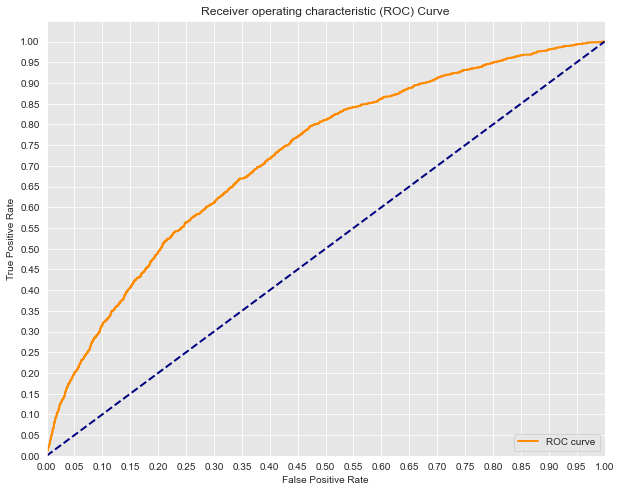

In [6]:
# Fit a model
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
logreg.fit(X_train, y_train)
print(logreg) # Preview model params

# Predict
y_hat_test = logreg.predict(X_test)

# First calculate the probability scores of each of the datapoints:
y_score = logreg.fit(X_train, y_train).decision_function(X_test)

fpr, tpr, thresholds = roc_curve(y_test, y_score) 

#Calculate AUC 
print('AUC: {}'.format(auc(fpr, tpr))) 
#Visualizing of ROC and AUC: 

# Set styling
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show() 

In [8]:
#Creates Function that runs classification report on model 
def model_report(model, y_test, X_test): 
    y_pred = model.predict(X_test)
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred)) 

model_report(logreg, y_test, X_test) #Runs fucnction

[[3807 1954]
 [ 650 1253]]
              precision    recall  f1-score   support

           0       0.85      0.66      0.75      5761
           1       0.39      0.66      0.49      1903

    accuracy                           0.66      7664
   macro avg       0.62      0.66      0.62      7664
weighted avg       0.74      0.66      0.68      7664



In [9]:
#Creates funtion to run the scores of both the training and testing set
def ind_score(model, X_train, X_Test):
    y_hat_train = model.predict(X_train)
    y_hat_test = model.predict(X_test)

    print('Training Precision: ', precision_score(y_train, y_hat_train))
    print('Testing Precision: ', precision_score(y_test, y_hat_test))
    print('\n\n')

    print('Training Recall: ', recall_score(y_train, y_hat_train))
    print('Testing Recall: ', recall_score(y_test, y_hat_test))
    print('\n\n')

    print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
    print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
    print('\n\n')

    print('Training F1-Score: ', f1_score(y_train, y_hat_train))
    print('Testing F1-Score: ', f1_score(y_test, y_hat_test)) 

ind_score(logreg, X_train, X_test) #Calls the above function

Training Precision:  0.6746399602714782
Testing Precision:  0.3907078266292485



Training Recall:  0.7088134266707248
Testing Recall:  0.6584340514976353



Training Accuracy:  0.6834862385321101
Testing Accuracy:  0.6602296450939458



Training F1-Score:  0.6913046243877615
Testing F1-Score:  0.4904109589041097


[[18944  9816]
 [ 3184  6373]]


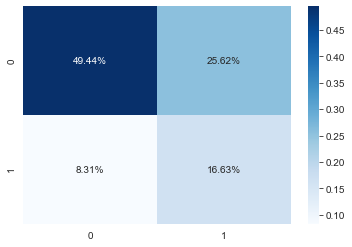

In [10]:
y_pred = logreg.predict(X)
#Get the confusion matrix
cf_matrix = confusion_matrix(y, y_pred)
print(cf_matrix)

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Blues') 
plt.show()

##### Baseline Model Eval 
We can see that our model performs decently well on our training set but poorl on our testing set. Though notably we can see from our accuracy score that it does perform better than random guessing though not by much.

<a name="section4c"></a>
#### Feature Selection 

One discovery from previous model testing is that my data is a bit noisy. Additionally, as all columns were turned into dummies there are a number of columns that are superfluous and should be removed.

##### RFECV Feature Selection

In [24]:
# Create recursive feature eliminator that scores features by mean squared errors
selector = RFECV(estimator=logreg, step=2, cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Fit recursive feature eliminator 
selector.fit(X_train, y_train) 

selected_rfe = X_train.columns[selector.support_]
removed_rfe = X_train.columns[~selector.support_]

Fitting estimator with 74 features.
Fitting estimator with 72 features.
Fitting estimator with 70 features.
Fitting estimator with 68 features.
Fitting estimator with 66 features.
Fitting estimator with 64 features.
Fitting estimator with 62 features.
Fitting estimator with 60 features.
Fitting estimator with 58 features.
Fitting estimator with 56 features.


In [25]:
#Test with RFECV features
#Variable Set Up
X = df[selected_rfe] #Sets X to all columns except the target
y = df["works_in_tech"] #Set the target column

# Normalize the Data
X = X.apply(lambda x : (x - x.min()) /(x.max() - x.min()),axis=0)

#Splits the data into a training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2 ,random_state=123)  

#Rebalance with 
sm = SMOTE(sampling_strategy = 'minority', random_state = 123)
X_train, y_train = sm.fit_resample(X_train, y_train)   

# Fit a model
logreg_r = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
logreg_r.fit(X_train, y_train)

# Predict
y_hat_test = logreg_r.predict(X_test) 

ind_score(logreg_r, X_train, X_test)

LogisticRegression(C=1000000000000.0, fit_intercept=False, solver='liblinear')
Training Precision:  0.6708902554789715
Testing Precision:  0.38834053053670575



Training Recall:  0.7067698595591113
Testing Recall:  0.6615869679453494



Training Accuracy:  0.6800295665028915
Testing Accuracy:  0.6572286012526096



Training F1-Score:  0.6883628356059965
Testing F1-Score:  0.48940719144800776


##### KBest Selection

In [33]:
#Crates a selector KBest
from sklearn.feature_selection import SelectKBest, f_regression,mutual_info_regression

selector = SelectKBest(f_regression, k=30)

selector.fit(X_train, y_train) 

selector.get_support()

array([ True,  True,  True,  True, False,  True,  True, False,  True,
        True, False, False,  True,  True, False, False, False, False,
       False, False,  True,  True,  True, False,  True, False,  True,
        True, False,  True,  True, False,  True, False, False,  True,
       False, False,  True,  True, False,  True,  True, False, False,
       False,  True,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False,  True, False, False,
       False,  True])

In [34]:
#Sets the removed and selected columns to variables
selected_columns = X_train.columns[selector.get_support()]
removed_columns = X_train.columns[~selector.get_support()]

In [35]:
selected_columns

Index(['age', 'height', 'female', 'male', 'gay', 'straight',
       'body_curvy/full_figured', 'body_fit/athletic', 'diet_anything',
       'diet_other', 'college_graduate_or_higher', 'no_college_degree',
       'unknown_education', 'black', 'hispanic/latin', 'indian', 'white',
       'has_kids', 'unknown_if_kids', 'likes_dogs', 'agnosticism', 'atheism',
       'catholicism', 'christianity', 'religion_other/unknown',
       'does_not_smoke', 'not_above_average_height', 'sign_unknown',
       'speaks_hindi', 'speaks_spanish'],
      dtype='object')

In [26]:
#Variable Set Up
X = df[selected_columns] #Sets X to all columns except the target
y = df["works_in_tech"] #Set the target column

# Normalize the Data
X = X.apply(lambda x : (x - x.min()) /(x.max() - x.min()),axis=0)

#Splits the data into a training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2 ,random_state=123)  

#Rebalance with 
sm = SMOTE(sampling_strategy = 'minority', random_state = 123)
X_train, y_train = sm.fit_resample(X_train, y_train)   

# Fit a model
logreg_k = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
logreg_k.fit(X_train, y_train)

# Predict
y_hat_test = logreg_k.predict(X_test) 

ind_score(logreg_k, X_train, X_test)

Training Precision:  0.6580421009605559
Testing Precision:  0.3863434821164647



Training Recall:  0.6999869559546067
Testing Recall:  0.6868102995270625



Training Accuracy:  0.6681160050436975
Testing Accuracy:  0.651356993736952



Training F1-Score:  0.6783667621776505
Testing F1-Score:  0.4945138100643208


##### Removing Redundant Columns 

Since kbest features worked better I will take this features and remove some of the ones that are redundant due to the dummying process.

In [51]:
new_feats = ['age', 'height', 'female', 'gay', 'straight', 'body_average', 'body_curvy/full_figured', 'body_fit/athletic',
             'body_thin/skinny', 'diet_anything', 'diet_other','diet_vegan/vegetarian', 'drinks_rarely/not_at_all',
             'unknown_if_drinker', 'no_drugs', 'unknown_if_drugs', 'college_graduate_or_higher', 
             'no_college_degree', 'asian', 'black', 'ethnicity_other/unknown', 'hispanic/latin', 'indian',
             'middle_eastern', 'has_kids', 'no_kids', 'dislikes_cats_and_or_dogs', 'likes_cats', 'likes_dogs',
             'agnosticism', 'atheism','buddhism', 'catholicism', 'christianity', 'hinduism', 'islam',
             'judaism', 'does_not_smoke', 'unknown_if_smokes', 'not_above_average_height','san_francisco_ca', 
             'aquarius', 'aries', 'cancer', 'capricorn', 'gemini', 'leo', 'libra', 'pisces', 'sagittarius',
             'scorpio', 'taurus', 'virgo', 'speaks_bengali', 'speaks_chinese', 'speaks_english', 
             'speaks_hindi', 'speaks_japanese', 'speaks_portuguese', 'speaks_russian', 'speaks_spanish', 'works_in_tech'] 
ndf= df[new_feats]

#Variable Set Up
X = ndf.drop(["works_in_tech"],axis=1) #Sets X to all columns except the target
y = ndf["works_in_tech"] #Set the target column

# Normalize the Data
X = X.apply(lambda x : (x - x.min()) /(x.max() - x.min()),axis=0)

#Splits the data into a training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2 ,random_state=123)  

#Rebalance with 
sm = SMOTE(sampling_strategy = 'minority', random_state = 123)
X_train, y_train = sm.fit_resample(X_train, y_train)   

# Fit a model
logregn = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
logregn.fit(X_train, y_train)

# Predict
y_hat_test = logregn.predict(X_test) 

ind_score(logregn, X_train, X_test)

Training Precision:  0.6831753160345975
Testing Precision:  0.3958669680335809



Training Recall:  0.7143354058872124
Testing Recall:  0.6442459274829218



Training Accuracy:  0.6915300665246316
Testing Accuracy:  0.6675365344467641



Training F1-Score:  0.6984079750037196
Testing F1-Score:  0.49040000000000006


In [52]:
model_report(logregn, y_test, X_test)

[[3890 1871]
 [ 677 1226]]
              precision    recall  f1-score   support

           0       0.85      0.68      0.75      5761
           1       0.40      0.64      0.49      1903

    accuracy                           0.67      7664
   macro avg       0.62      0.66      0.62      7664
weighted avg       0.74      0.67      0.69      7664



##### Feature Selection
Removing the excess features had only a marginal positive effect on the model but did accomplish the job of removing a bit of the noise.

<a name="section4d"></a>
#### Grid Search 
In order to narrow down parameters I will first perform a grid search of the hyperparameters. 

In [53]:
#Runs cross validation score for model
mean_score = np.mean(cross_val_score(logregn, X_train, y_train, cv=3))

print(f"Mean Cross Validation Score for Classifier: {mean_score :.2%}")

Mean Cross Validation Score for Classifier: 68.74%


In [55]:
# Create regularization penalty space
penalty = ['l1', 'l2']

# Create regularization hyperparameter space
C = np.logspace(0, 4, 10)

# Create hyperparameter options
hyperparameters = dict(C=C, penalty=penalty) 

# Create grid search using 5-fold cross validation
clf = GridSearchCV(logregn, hyperparameters, cv=5, verbose=0, scoring ='f1') 

# Fit grid search
best_model = clf.fit(X, y) 

# View best hyperparameters
print('Best Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_model.best_estimator_.get_params()['C'])

Best Penalty: l1
Best C: 1291.5496650148827


##### Grid Search Tuning Result

Using these parameters I will now build my final model. 

<a name="section4e"></a>  
### Final Model 

Using the parameters from my gridsearch I can now run my final model. 

AUC: 0.7162077838160688


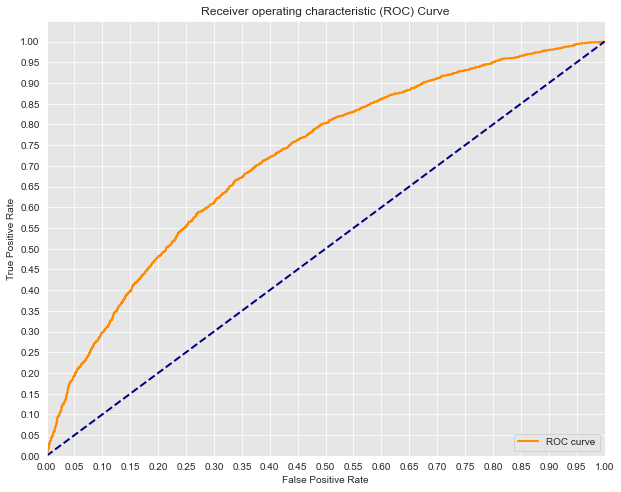

In [62]:
# Fit a model
logregn = LogisticRegression(penalty='l1', C=1291.5496650148827, solver='liblinear', random_state = 23)
logregn.fit(X_train, y_train)

# Predict
y_hat_test = logregn.predict(X_test) 

# First calculate the probability scores of each of the datapoints:
y_score = logregn.fit(X_train, y_train).decision_function(X_test)

fpr, tpr, thresholds = roc_curve(y_test, y_score) 

#Calculate AUC 
print('AUC: {}'.format(auc(fpr, tpr))) 

#Visualizing of ROC and AUC: 
# Set styling
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show() 

In [63]:
model_report(logregn, y_test, X_test)

[[3891 1870]
 [ 677 1226]]
              precision    recall  f1-score   support

           0       0.85      0.68      0.75      5761
           1       0.40      0.64      0.49      1903

    accuracy                           0.67      7664
   macro avg       0.62      0.66      0.62      7664
weighted avg       0.74      0.67      0.69      7664



In [64]:
#Prints scores for both training and testing set
ind_score(logregn, X_train, X_test)

Training Precision:  0.683177375753795
Testing Precision:  0.39599483204134367



Training Recall:  0.7142484455845907
Testing Recall:  0.6442459274829218



Training Accuracy:  0.6915083264489761
Testing Accuracy:  0.6676670146137788



Training F1-Score:  0.6983674857580138
Testing F1-Score:  0.4904980996199239


In [156]:
#Runs cross validation score for new model
mean_rf_cv_score = np.mean(cross_val_score(logreg2, X_train, y_train))

print(f"Mean Cross Validation Score for Random Forest Classifier: {mean_rf_cv_score :.2%}")

Mean Cross Validation Score for Random Forest Classifier: 82.69%


Train AUC: 0.7583202286809057
Test AUC: 0.7162077838160688


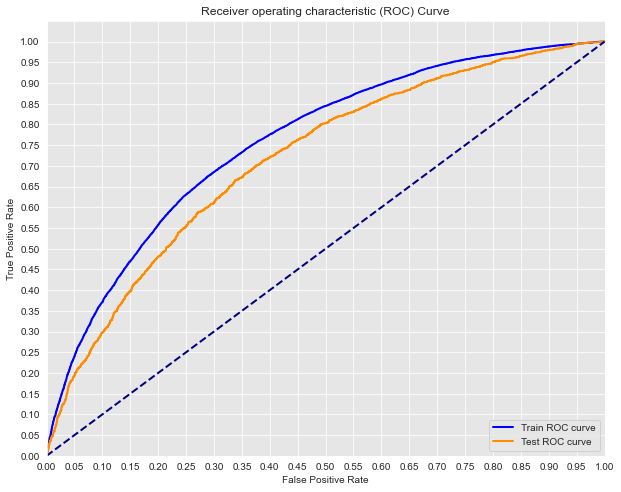

In [65]:
y_train_score = logregn.decision_function(X_train)
y_test_score = logregn.decision_function(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)

print('Train AUC: {}'.format(auc(train_fpr, train_tpr)))
print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))

plt.figure(figsize=(10, 8))
lw = 2

plt.plot(train_fpr, train_tpr, color='blue',
         lw=lw, label='Train ROC curve')
plt.plot(test_fpr, test_tpr, color='darkorange',
         lw=lw, label='Test ROC curve')

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<a name="section5"></a>  
## Conclusion

This project took many twist and terms and ultimately my model did not perform as well as I may have like but I do think there are reasons for that beyond the model. The fact that the model had trouble predicting is a good thing. It means my target is varied enough to not be easily distinguished which leads me to think that the population of people who work in tech, is in fact, quite diverse. Though further testing would be needed to prove this theory.

<a name="section5a"></a>  
### Next Steps 

In order to take this project to the next level I belive there are a number of things that could be done. Among the first steps would be to re-integrate many of the attitudes and more specific catagories that were simplified early on in this project. Next, I think using data from a non-dating site would perhaps also give a clearer picture since it is hard to say if this sample is truly representative of the whole give where the data was sourced from. 